In [1]:
path = "./Data/Duramat_no_pool_labels.pkl"
import pandas as pd
df = pd.read_pickle(path)

https://github.com/fhrzn/sml-tech/blob/main/Tasks/Course%20Project/vit-shoe-vs-sandals.
https://github.com/NielsRogge/Transformers-Tutorials/blob/master/SigLIP/Fine_tuning_SigLIP_and_friends_for_multi_label_image_classification.ipynb

In [2]:
path = "./OPENAI/23-P09-D/dataset_arrays_23-P09-D.pkl"
import pandas as pd
df_test = pd.read_pickle(path)

In [17]:
import pandas as pd
import numpy as np

# Convert df_test list to DataFrame and reshape images
images = []
labels = []

for item in df_test:
    if isinstance(item, dict):
        img = item['images']
        label = item['labels']
    elif isinstance(item, (tuple, list)):
        img = item[0]
        label = item[1]
    else:
        img = item
        label = -1
    
    # Convert from (4, 224, 224) to (224, 224, 3)
    if img.shape[0] == 4:  # If shape is (4, 224, 224)
        # Take the first channel and repeat it 3 times
        single_channel = img[0]  # Shape: (224, 224)
        img_rgb = np.stack([single_channel, single_channel, single_channel], axis=-1)  # Shape: (224, 224, 3)
    else:
        img_rgb = img
    
    images.append(img_rgb)
    labels.append(label)

df_test_converted = pd.DataFrame({
    'images': images,
    'labels': labels
})

# Verify the conversion
print(f"Shape: {df_test_converted.shape}")
print(f"First image shape: {df_test_converted.images[0].shape}")
print(df_test_converted.labels.value_counts())

Shape: (160, 2)
First image shape: (224, 224, 3)
labels
0         99
5         53
1          4
3          2
[3, 5]     1
2          1
Name: count, dtype: int64


In [18]:
df_test_converted.images[0
                         ].shape

(224, 224, 3)

In [20]:
df.labels.value_counts()

labels
0    5877
6    1744
2     985
4     933
5     407
1     158
3      28
Name: count, dtype: int64

In [21]:
df = df[df.labels >= 0]

In [22]:
df.images[5][:,:,2]

array([[36, 36, 39, ..., 50, 50, 48],
       [32, 35, 41, ..., 47, 50, 50],
       [39, 42, 45, ..., 47, 51, 53],
       ...,
       [26, 26, 26, ..., 49, 48, 45],
       [26, 26, 26, ..., 49, 49, 47],
       [26, 26, 26, ..., 47, 47, 42]])

In [23]:
df.labels.value_counts()

labels
0    5877
6    1744
2     985
4     933
5     407
1     158
3      28
Name: count, dtype: int64

In [24]:
labels = df.labels.unique()
len(labels)
df['images'][5].mean()

181.903904

In [25]:
from transformers import ViTFeatureExtractor, ViTForImageClassification
from transformers import TrainingArguments, Trainer


In [26]:
import torch
model_ckpt = 'google/vit-base-patch16-224-in21k'
device = torch.device('mps' if torch.cuda.is_available() else 'cpu')
extractor = ViTFeatureExtractor.from_pretrained(model_ckpt)   #problem_type="multi_label_classification"  --> label torch.tensor([[1, 1, 0, 0]])
device

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


device(type='cpu')

In [27]:
def batch_transform(examples):
    # take a list of PIL images and turn into pixel values
    inputs = extractor([x for x in examples['images']], return_tensors='pt')
    # add the labels in
    inputs['labels'] = examples['labels']
    
    return inputs

In [28]:
df_transformed = batch_transform(df)


In [60]:
df_test_converted

,images,labels
0,"[[[63, 63, 63], [62, 62, 62], [62, 62, 62], [6...",0
1,"[[[89, 89, 89], [86, 86, 86], [87, 87, 87], [8...",0
2,"[[[103, 103, 103], [104, 104, 104], [103, 103,...",0
3,"[[[109, 109, 109], [109, 109, 109], [107, 107,...",0
4,"[[[63, 63, 63], [63, 63, 63], [59, 59, 59], [5...",5
...,...,...
155,"[[[111, 111, 111], [111, 111, 111], [114, 114,...",0
156,"[[[67, 67, 67], [69, 69, 69], [69, 69, 69], [6...",0
157,"[[[88, 88, 88], [88, 88, 88], [88, 88, 88], [9...",3
158,"[[[105, 105, 105], [104, 104, 104], [106, 106,...",0


In [61]:
df_transformed

{'pixel_values': tensor([[[[-0.7255, -0.7098, -0.6863,  ..., -0.6000, -0.6078, -0.6235],
          [-0.7333, -0.7020, -0.6706,  ..., -0.6235, -0.6157, -0.6000],
          [-0.6941, -0.6627, -0.6627,  ..., -0.6235, -0.6078, -0.5843],
          ...,
          [-0.7961, -0.7961, -0.7961,  ..., -0.6314, -0.6314, -0.6471],
          [-0.7961, -0.7961, -0.7961,  ..., -0.6157, -0.6157, -0.6314],
          [-0.7961, -0.7961, -0.7961,  ..., -0.6314, -0.6314, -0.6549]],

         [[-0.7255, -0.7098, -0.6863,  ..., -0.6000, -0.6078, -0.6235],
          [-0.7333, -0.7020, -0.6706,  ..., -0.6235, -0.6157, -0.6000],
          [-0.6941, -0.6627, -0.6627,  ..., -0.6235, -0.6078, -0.5843],
          ...,
          [-0.7961, -0.7961, -0.7961,  ..., -0.6314, -0.6314, -0.6471],
          [-0.7961, -0.7961, -0.7961,  ..., -0.6157, -0.6157, -0.6314],
          [-0.7961, -0.7961, -0.7961,  ..., -0.6314, -0.6314, -0.6549]],

         [[-0.7255, -0.7098, -0.6863,  ..., -0.6000, -0.6078, -0.6235],
          [-0

In [29]:
df_transformed_TEST = batch_transform(df_test_converted)

In [62]:
df_transformed_TEST

{'pixel_values': tensor([[[[-0.5059, -0.5137, -0.5137,  ..., -0.4980, -0.5137, -0.5059],
          [-0.5216, -0.5137, -0.5059,  ..., -0.4902, -0.5216, -0.4824],
          [-0.5216, -0.5059, -0.4902,  ..., -0.4980, -0.5137, -0.5216],
          ...,
          [-0.5294, -0.5137, -0.5137,  ..., -0.4667, -0.4902, -0.4745],
          [-0.5137, -0.5137, -0.5216,  ..., -0.4902, -0.4588, -0.4510],
          [-0.4980, -0.4980, -0.5137,  ..., -0.4824, -0.4745, -0.4902]],

         [[-0.5059, -0.5137, -0.5137,  ..., -0.4980, -0.5137, -0.5059],
          [-0.5216, -0.5137, -0.5059,  ..., -0.4902, -0.5216, -0.4824],
          [-0.5216, -0.5059, -0.4902,  ..., -0.4980, -0.5137, -0.5216],
          ...,
          [-0.5294, -0.5137, -0.5137,  ..., -0.4667, -0.4902, -0.4745],
          [-0.5137, -0.5137, -0.5216,  ..., -0.4902, -0.4588, -0.4510],
          [-0.4980, -0.4980, -0.5137,  ..., -0.4824, -0.4745, -0.4902]],

         [[-0.5059, -0.5137, -0.5137,  ..., -0.4980, -0.5137, -0.5059],
          [-0

In [38]:
df_transformed.keys()
df_transformed.labels


5        0
9        0
11       0
13       5
16       5
        ..
29650    0
29655    6
29656    0
29661    0
29663    0
Name: labels, Length: 10132, dtype: int64

In [32]:
from sklearn.model_selection import train_test_split

In [64]:
X_train, X_val, y_train, y_val = train_test_split(df_transformed.pixel_values, df_transformed.labels, test_size=.3, random_state=42, stratify=df_transformed.labels)

In [34]:
X_train.shape, X_val.shape

(torch.Size([7092, 3, 224, 224]), torch.Size([3040, 3, 224, 224]))

In [68]:
df_transformed_TEST['pixel_values']

tensor([[[[-0.5059, -0.5137, -0.5137,  ..., -0.4980, -0.5137, -0.5059],
          [-0.5216, -0.5137, -0.5059,  ..., -0.4902, -0.5216, -0.4824],
          [-0.5216, -0.5059, -0.4902,  ..., -0.4980, -0.5137, -0.5216],
          ...,
          [-0.5294, -0.5137, -0.5137,  ..., -0.4667, -0.4902, -0.4745],
          [-0.5137, -0.5137, -0.5216,  ..., -0.4902, -0.4588, -0.4510],
          [-0.4980, -0.4980, -0.5137,  ..., -0.4824, -0.4745, -0.4902]],

         [[-0.5059, -0.5137, -0.5137,  ..., -0.4980, -0.5137, -0.5059],
          [-0.5216, -0.5137, -0.5059,  ..., -0.4902, -0.5216, -0.4824],
          [-0.5216, -0.5059, -0.4902,  ..., -0.4980, -0.5137, -0.5216],
          ...,
          [-0.5294, -0.5137, -0.5137,  ..., -0.4667, -0.4902, -0.4745],
          [-0.5137, -0.5137, -0.5216,  ..., -0.4902, -0.4588, -0.4510],
          [-0.4980, -0.4980, -0.5137,  ..., -0.4824, -0.4745, -0.4902]],

         [[-0.5059, -0.5137, -0.5137,  ..., -0.4980, -0.5137, -0.5059],
          [-0.5216, -0.5137, -

In [69]:
from datasets import Dataset
ds_train = Dataset.from_dict({
                "image": X_train,
                "labels": y_train
            })
ds_train

Dataset({
    features: ['image', 'labels'],
    num_rows: 7092
})

In [36]:
ds_val = Dataset.from_dict({
                "image": X_val,
                "labels": y_val
            })
ds_val

Dataset({
    features: ['image', 'labels'],
    num_rows: 3040
})

In [59]:
X_test, _, y_test, _ = train_test_split(df_transformed_TEST.pixel_values, df_transformed_TEST.labels, test_size=.1, random_state=42, stratify=df_transformed_TEST.labels)
s_test = Dataset.from_dict({
                "image": X_test,
                "labels": y_test
            })

TypeError: '<' not supported between instances of 'list' and 'int'

In [23]:
model = ViTForImageClassification.from_pretrained(model_ckpt,
                                                 num_labels=len(labels),
                                                 id2label={str(i): str(c) for i, c in enumerate(labels)},
                                                 label2id={str(c): str(i) for i, c in enumerate(labels)})
model = model.to(device)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [24]:
batch_size = 16
logging_steps = len(X_train) // batch_size
training_args = TrainingArguments(output_dir='./working/',
                                 per_device_train_batch_size=batch_size,
                                 per_device_eval_batch_size=batch_size,
                                 evaluation_strategy='epoch',
                                 save_strategy='epoch',
                                 num_train_epochs=6,
                                 fp16=True if torch.cuda.is_available() else False,
                                 logging_steps=logging_steps,
                                 learning_rate=1e-5,
                                 save_total_limit=2,
                                 remove_unused_columns=False,
                                 push_to_hub=False,
                                 load_best_model_at_end=True)

/Users/eagle/Documents/eagle-classification/venv_eagle_class/lib/python3.9/site-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [25]:
from sklearn.metrics import f1_score, accuracy_score
# from datasets import load_metric
import matplotlib.pyplot as plt
# import evaluate

# # Load the metric
# metric = evaluate.load("accuracy")

def collate_fn(examples):
    return {
        'pixel_values': torch.stack([torch.tensor(x['image']) for x in examples]),
        'labels': torch.tensor([x['labels'] for x in examples])
    }

# metric = load_metric('accuracy')
def compute_metrics(p):
    labels = p.label_ids
    print(labels)
    preds = p.predictions.argmax(-1)
    print(preds)
    acc = accuracy_score(labels, preds)
    f1 = f1_score(labels, preds, average='weighted')
    return {
        'accuracy': acc,
        'f1': f1
    }

In [26]:
trainer = Trainer(model=model,
                 args=training_args,
                 data_collator=collate_fn,
                 compute_metrics=compute_metrics,
                 train_dataset=ds_train,
                 eval_dataset=ds_val,
                 tokenizer=extractor)

/var/folders/s4/l6k_zf9573j5vh_2y0qy50sc0000gx/T/ipykernel_95347/386101187.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(model=model,


In [30]:
# run this right after you build ds_train / trainer but before trainer.train()
from torch.utils.data import DataLoader
dl = DataLoader(ds_train, batch_size=8, shuffle=False, collate_fn=collate_fn)
batch = next(iter(dl))
print("batch keys:", batch.keys())
print("pixel_values:", batch['pixel_values'].shape, batch['pixel_values'].dtype)
print("labels:", getattr(batch['labels'], 'shape', None), type(batch['labels']), getattr(batch['labels'], 'dtype', None))
# if labels are nested lists print example
print("labels sample:", batch['labels'])

# forward/backward quick test
import torch
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
model.to(device)
model.train()
batch = next(iter(dl))
px = batch['pixel_values'].to(device)
labels = batch['labels'].to(device)

# set problem_type based on labels shape/dtype
if labels.dim() == 1 or labels.dtype == torch.long:
    model.config.problem_type = "single_label_classification"
else:
    model.config.problem_type = "multi_label_classification"

out = model(pixel_values=px, labels=labels)   # transformers returns loss if labels provided
print("logits shape:", out.logits.shape, "labels shape:", labels.shape)
print("loss:", out.loss.item())
out.loss.backward()
print("backward OK")

batch keys: dict_keys(['pixel_values', 'labels'])
pixel_values: torch.Size([8, 3, 224, 224]) torch.float32
labels: torch.Size([8]) <class 'torch.Tensor'> torch.int64
labels sample: tensor([0, 0, 0, 0, 6, 0, 0, 2])
logits shape: torch.Size([8, 7]) labels shape: torch.Size([8])
loss: 1.985393762588501


RuntimeError: view size is not compatible with input tensor's size and stride (at least one dimension spans across two contiguous subspaces). Use .reshape(...) instead.

In [27]:
train_result = trainer.train()

RuntimeError: view size is not compatible with input tensor's size and stride (at least one dimension spans across two contiguous subspaces). Use .reshape(...) instead.

In [26]:
predictions = trainer.predict(ds_val) 
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

100%|██████████| 190/190 [02:35<00:00,  1.22it/s]

[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]


{'test_loss': 0.11492014676332474,
 'test_accuracy': 0.9805921052631579,
 'test_f1': 0.9804932590958934,
 'test_runtime': 157.5811,
 'test_samples_per_second': 19.292,
 'test_steps_per_second': 1.206}

# Duramat labeled

In [81]:
trained_state_dict = trainer.model.state_dict()
torch.save(trained_state_dict, './Data/ViT_trained_state_dict.pth')

In [23]:
model_test = ViTForImageClassification.from_pretrained(model_ckpt,
                                                 num_labels=len(labels),
                                                 id2label={str(i): str(c) for i, c in enumerate(labels)},
                                                 label2id={str(c): str(i) for i, c in enumerate(labels)})
model_test.load_state_dict(torch.load('./Data/ViT_trained_state_dict.pth', map_location=device))
model_test.to(device)
model_test.eval()

trainer_test = Trainer(model=model_test,
                 args=training_args,
                 data_collator=collate_fn,
                 compute_metrics=compute_metrics,
                 train_dataset=ds_train,
                 eval_dataset=ds_val,
                 tokenizer=extractor)
predictions = trainer_test.predict(ds_val)


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/var/folders/ll/q05yzpn91gzfyfdfqcfyqqq80000gn/T/ipykernel_12012/743985368.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by th

[0 2 2 ... 4 0 0]
[0 2 2 ... 4 0 0]


In [59]:
predlabels = predictions.predictions.argmax(axis=-1)
import numpy as np
type(ds_val['labels'])
type(predlabels.tolist())

unique_labels = np.unique(ds_val['labels'])

In [65]:

from ChannelViT.utils import calculate_class_accuracy
import numpy as np
unique_labels = np.unique(ds_val['labels'])
class_accuracies = {}
for label in unique_labels.tolist():
    class_accuracies[int(label)] = calculate_class_accuracy(np.array(ds_val['labels']), predlabels, class_label=label)
class_accuracies

{0: 1.0,
 1: 0.8333333333333334,
 2: 0.9864864864864865,
 3: 1.0,
 4: 0.9178571428571428,
 5: 0.9754098360655737,
 6: 0.9598470363288719}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

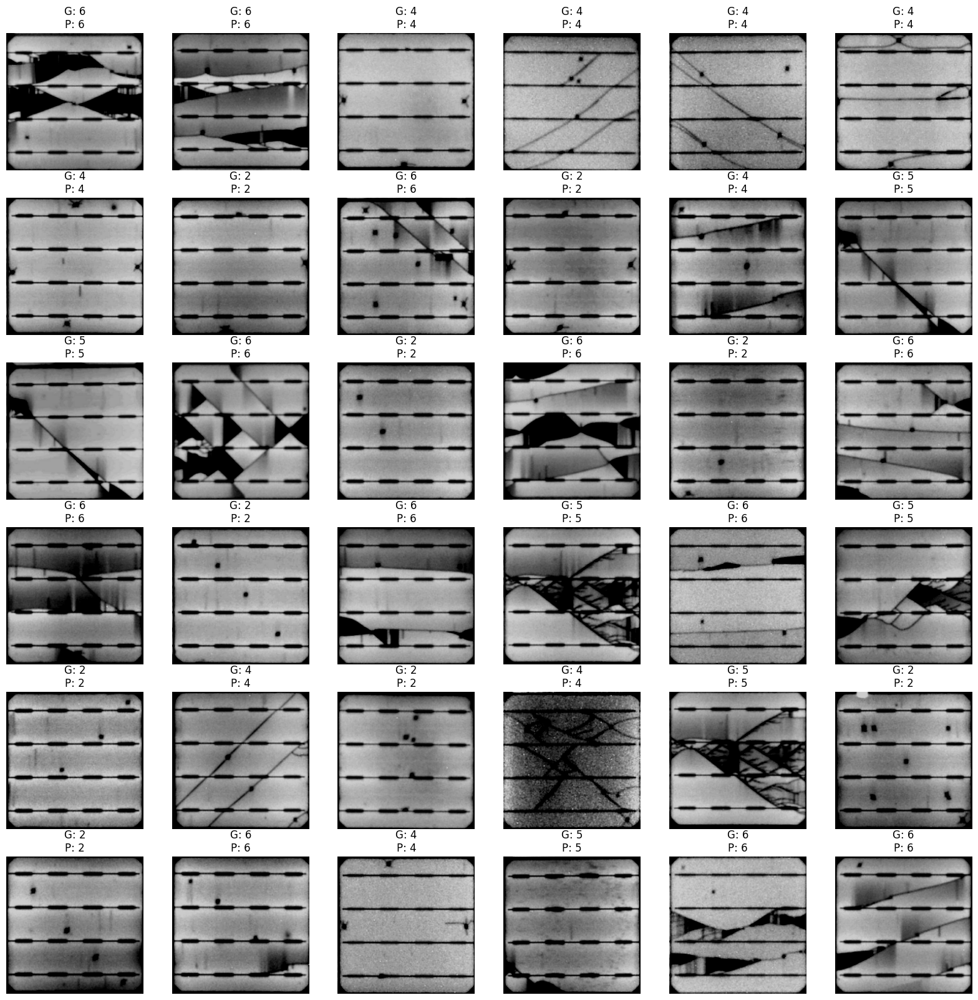

In [24]:
# plot correct samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_val.shape[0], 1, replace=False)
            if ds_val[int(idx[0])]["labels"] > 0 and ds_val[int(idx[0])]["labels"] == predlabels[int(idx[0])]:
                break
        s = ds_val[int(idx[0])]
        ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
        ax[i,j].set_title(f"G: {s['labels']}\nP: {predictions.label_ids[int(idx[0])]}")
        ax[i,j].axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

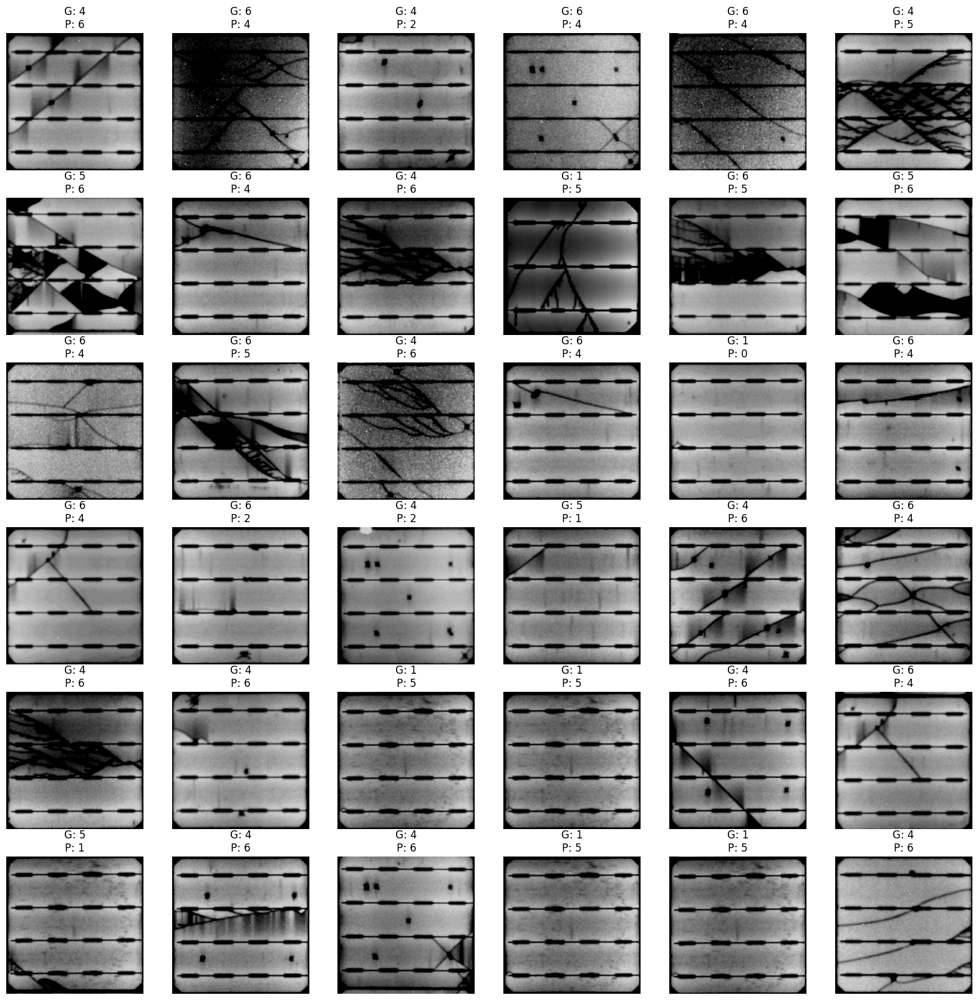

In [25]:
# plot wrong samples
idx = -1
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        for id in np.where(ds_val['labels'] != predlabels)[0]:
            if id > idx:
                idx = int(id)
                break
        if idx > -1:
            s = ds_val[idx]
            ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
            ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels[idx]}")
            ax[i,j].axis('off')
plt.show()

# Infinity

In [1]:
path = "./Data/Infinity_all_no_pool_labels.pkl"
df_inf = pd.read_pickle(path)
df_inf = df_inf[df_inf.labels >= 0]
df_inf = df_inf[df_inf.labels <= 6]
df_inf_transformed = batch_transform(df_inf)
ds_test = Dataset.from_dict({
                "image": df_inf_transformed.pixel_values,
                "labels": df_inf_transformed.labels
            })
ds_test

NameError: name 'pd' is not defined

In [80]:
pd.DataFrame(ds_test['labels']).value_counts()


0
0    2112
2     156
1      39
3      21
4      15
5      11
Name: count, dtype: int64

In [70]:
predictions = trainer.predict(ds_test)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

100%|██████████| 148/148 [01:59<00:00,  1.24it/s]

[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]


{'test_loss': 0.23658466339111328,
 'test_accuracy': 0.9392523364485982,
 'test_f1': 0.9298861166845726,
 'test_runtime': 121.4495,
 'test_samples_per_second': 19.383,
 'test_steps_per_second': 1.219}

In [74]:

from ChannelViT.utils import calculate_class_accuracy
import numpy as np
unique_labels = np.unique(ds_test['labels'])
print(unique_labels)
class_accuracies = {}
for label in unique_labels.tolist():
    class_accuracies[int(label)] = calculate_class_accuracy(np.array(ds_test['labels']), predlabels, class_label=label)
    print(class_accuracies[int(label)] )
class_accuracies

[0 1 2 3 4 5]
0.9933712121212122
0.8717948717948718
0.4423076923076923
0.0
0.0
0.9090909090909091


{0: 0.9933712121212122,
 1: 0.8717948717948718,
 2: 0.4423076923076923,
 3: 0.0,
 4: 0.0,
 5: 0.9090909090909091}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

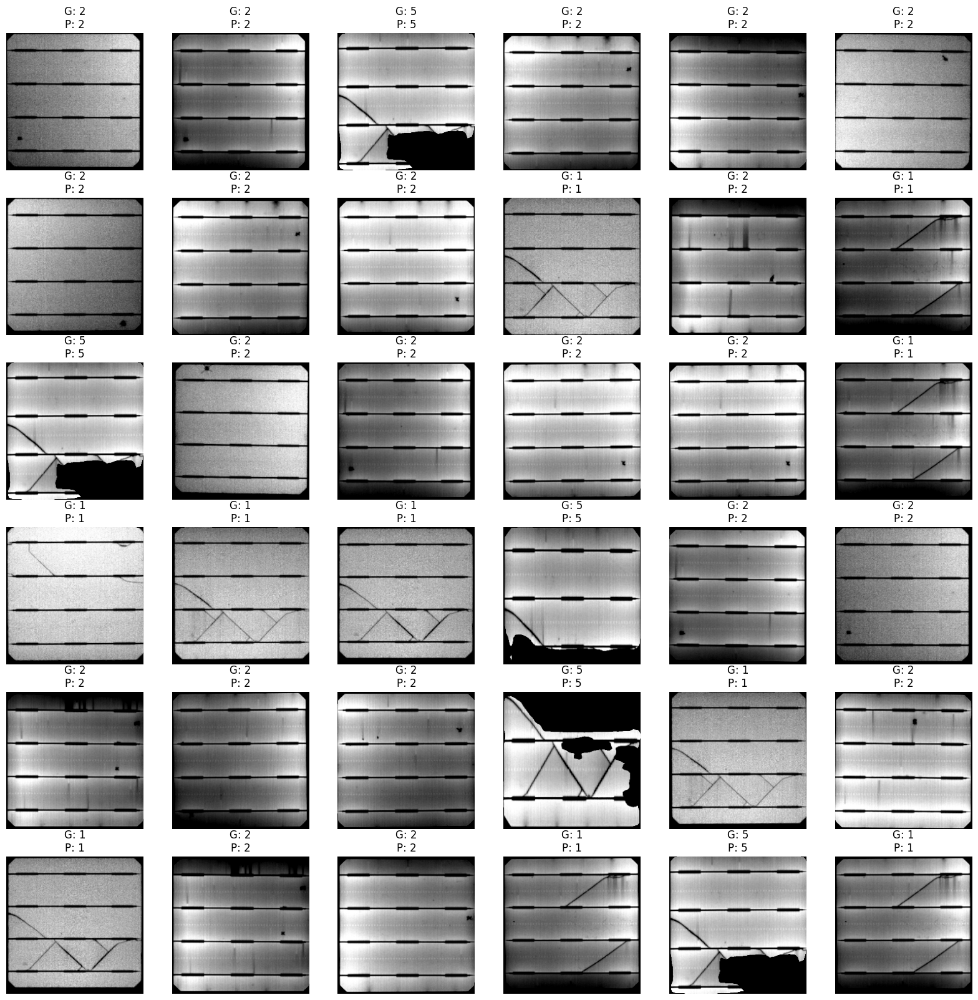

In [29]:
# plot correct samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_test.shape[0], 1, replace=False)
            if ds_test[int(idx[0])]["labels"] > 0 and ds_test[int(idx[0])]["labels"] == predlabels[int(idx[0])]:
                break
        s = ds_test[int(idx[0])]
        ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
        ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

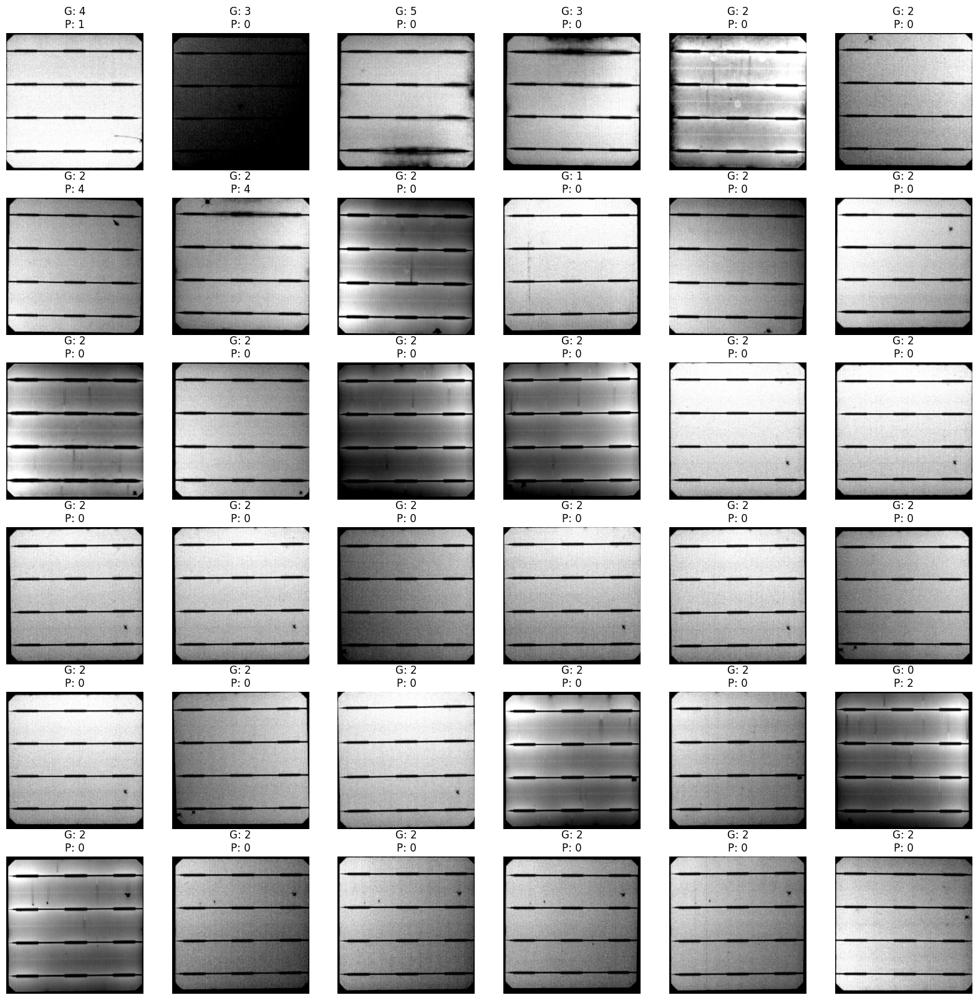

In [30]:
# plot wrong samples
idx = -1
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        for id in np.where(ds_test['labels'] != predlabels)[0]:
            if id > idx:
                idx = int(id)
                break
        if idx > -1:
            s = ds_test[idx]
            ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
            ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels[idx]}")
            ax[i,j].axis('off')
plt.show()

# Duramat mono 3 (unlabeled)

In [31]:
path_all = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_no_pool.pkl"
path_all_max = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_maxpool.pkl"
df_all = pd.read_pickle(path_all)
df_all_max = pd.read_pickle(path_all_max)
df_mono_3 = df_all.loc[df_all_max["technology"]=="mono_3"]
df_mono_3 = batch_transform(df_mono_3)
ds_mono_3 = Dataset.from_dict({
                "image": df_mono_3.pixel_values,
                "labels": np.zeros(df_mono_3.pixel_values.shape[0])
            })
ds_mono_3

Dataset({
    features: ['image', 'labels'],
    num_rows: 807
})

In [32]:
predictions = trainer.predict(ds_mono_3)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.2632761299610138,
 'test_accuracy': 0.9392812887236679,
 'test_f1': 0.9686900958466453,
 'test_runtime': 45.4231,
 'test_samples_per_second': 17.766,
 'test_steps_per_second': 1.123}

In [33]:
np.sum(predlabels != 0)

49

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

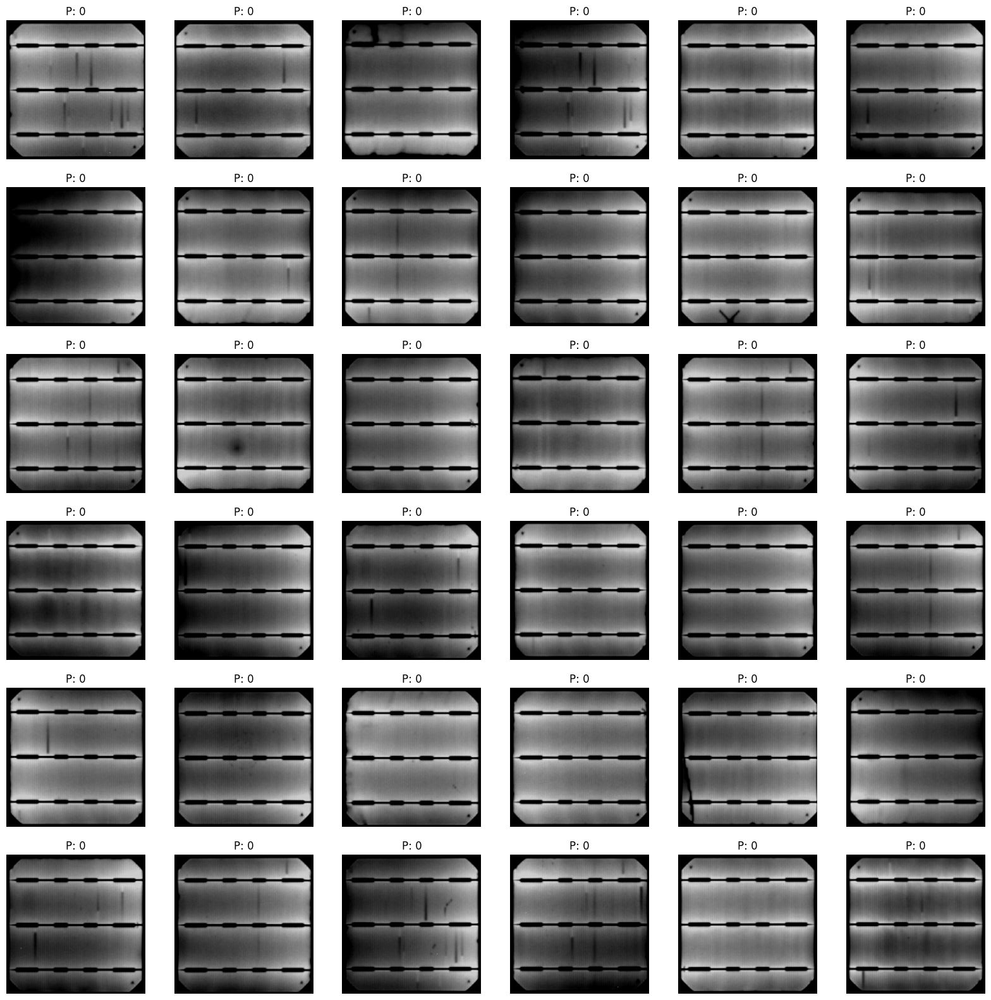

In [34]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

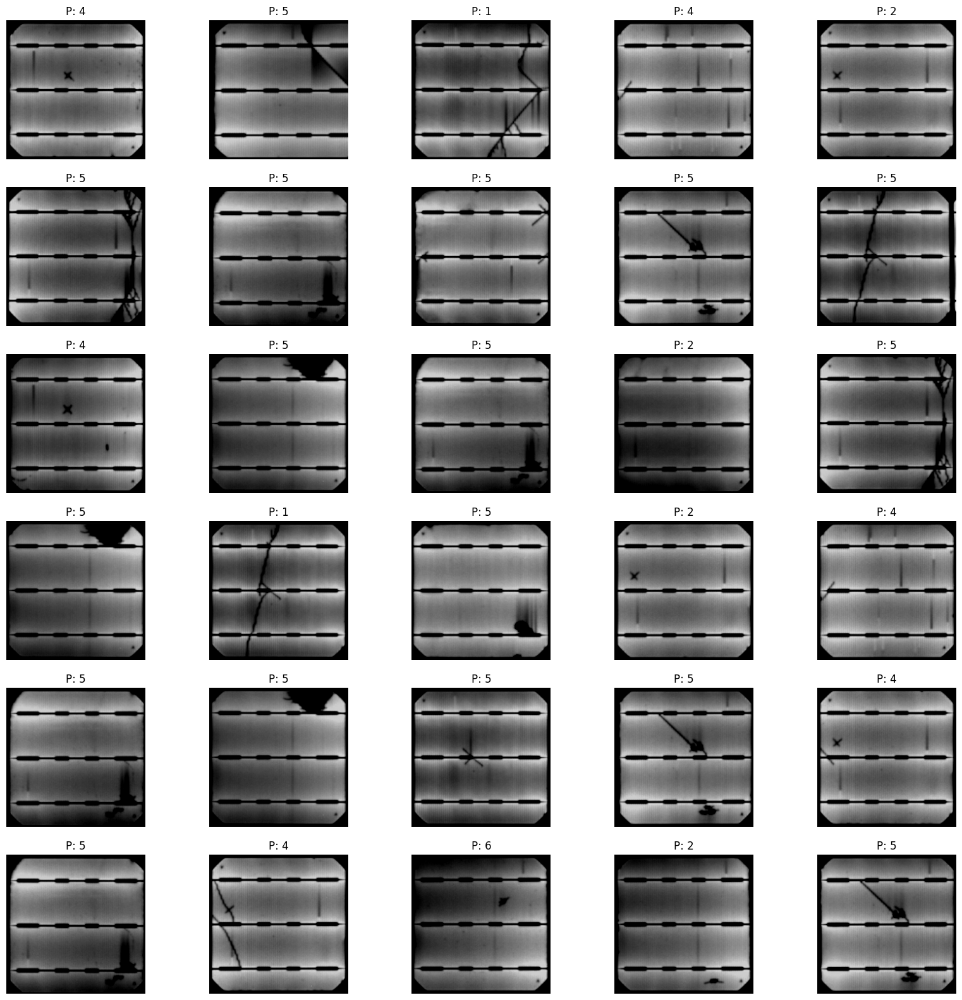

In [35]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# Duramat Mono4 (unlabeled)

In [36]:
import tensorflow as tf

In [37]:
def extract_original_images(tf_dataset : tf.data.Dataset) -> np.ndarray:
    '''
    Function for the unsupervised case.
    Extracts the original images from a tf Dataset and saves them into a numpy array for further processing (e.g. with UMAP)
    This function assumes that offset = 0 and crop_size = image_size if cropped == none
    This function assumes it is working with images and not features extracted from images.
    '''
    images = []
    for batch_images in tf_dataset:
            for im in batch_images:
                images.append(np.array(im).astype(int))
 
    return images
 
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/duramat_mono4_big"
data_ds_mono4 = tf.keras.utils.image_dataset_from_directory(
            directory=directory,
            labels=None,
            batch_size=128,
            #image_size=image_size,
            seed=42,
            #subset= subset,
            #validation_split=validation_split,
            shuffle = False)
 
original_images = extract_original_images(data_ds_mono4)
 
df_mono_4 = pd.DataFrame(data = {"images" : original_images, "labels": np.zeros(len(original_images))})

df_mono_4 = batch_transform(df_mono_4)
ds_mono_4 = Dataset.from_dict({
                "image": df_mono_4.pixel_values,
                "labels": np.zeros(df_mono_4.pixel_values.shape[0])
            })
ds_mono_4


Found 10620 files.


2024-11-28 16:10:48.366306: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Ultra
2024-11-28 16:10:48.366341: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 128.00 GB
2024-11-28 16:10:48.366346: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 48.00 GB
2024-11-28 16:10:48.366545: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-11-28 16:10:48.366566: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-11-28 16:11:02.346751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Dataset({
    features: ['image', 'labels'],
    num_rows: 10620
})

In [38]:
predictions = trainer.predict(ds_mono_4)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.41850829124450684,
 'test_accuracy': 0.901412429378531,
 'test_f1': 0.9481503491308869,
 'test_runtime': 578.0253,
 'test_samples_per_second': 18.373,
 'test_steps_per_second': 1.149}

In [39]:
np.sum(predlabels != 0)

1047

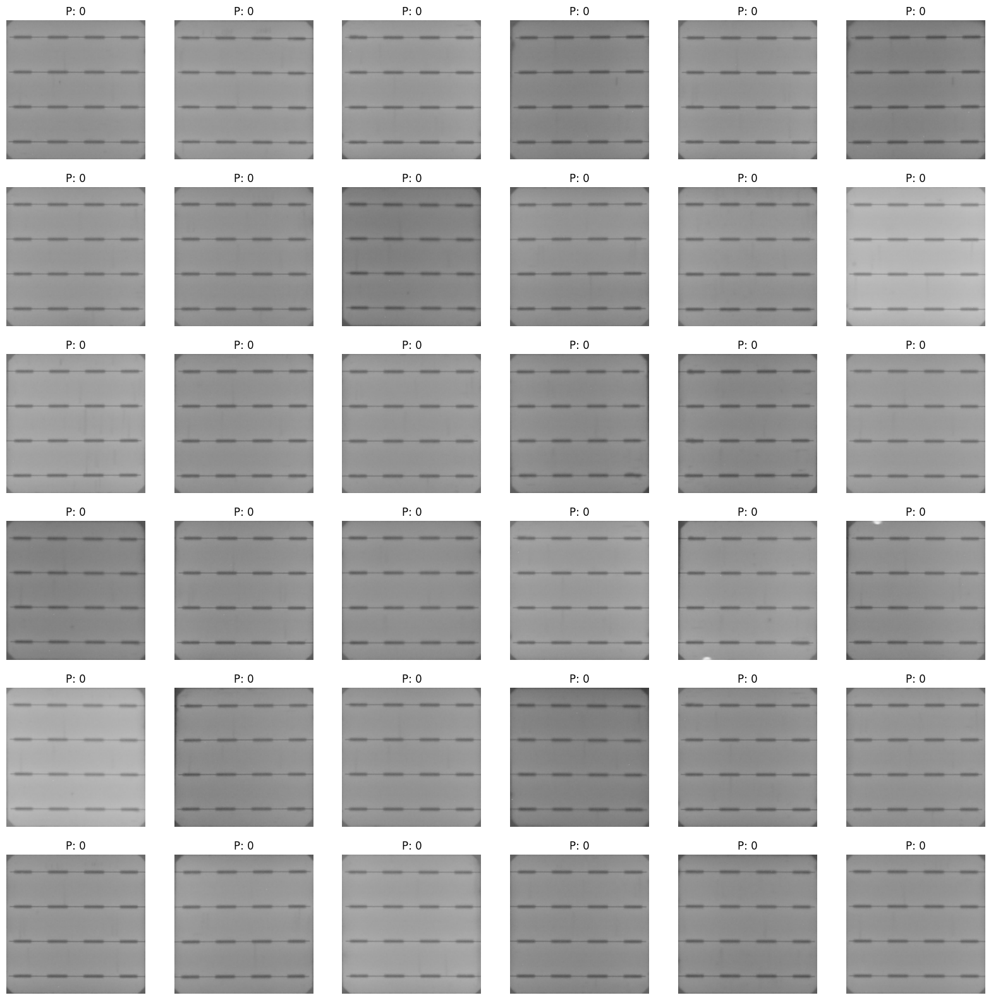

In [40]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

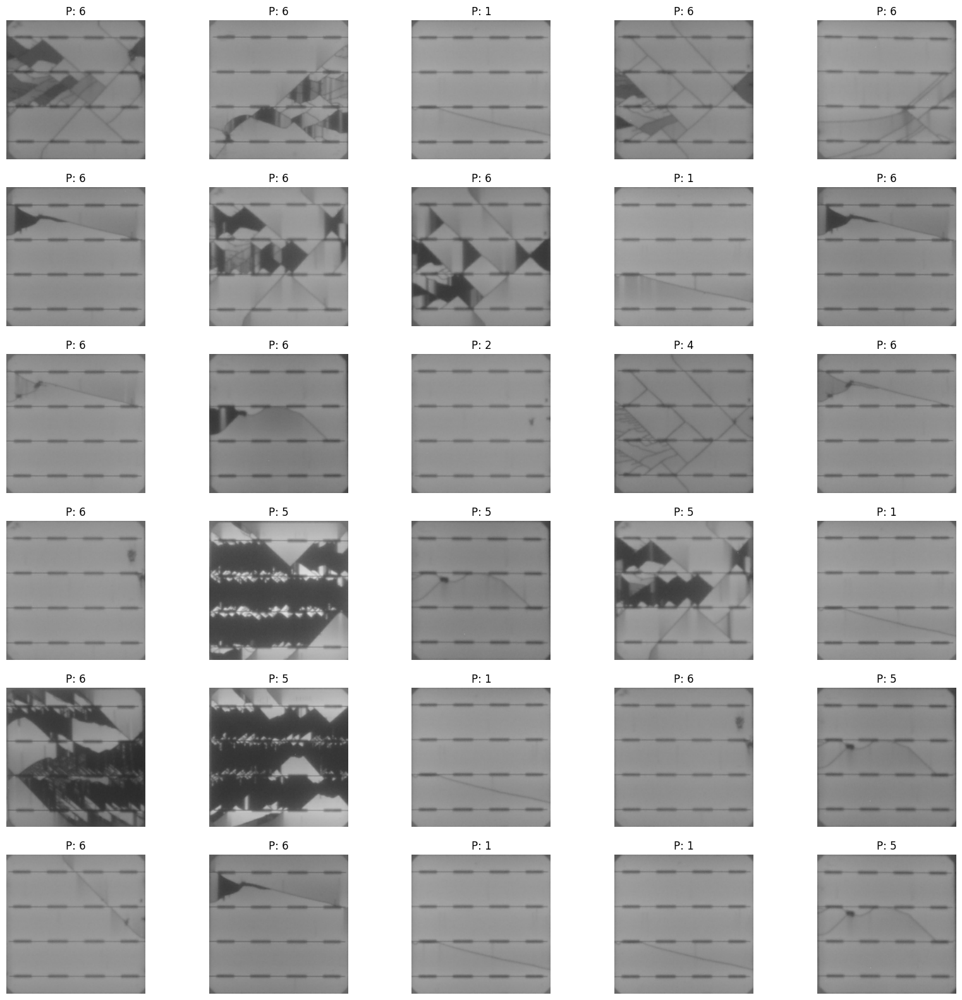

In [41]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# TISO (unlabeled)

In [ ]:
import os
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/TISO-EAGLE-23-P09_images"
def decode_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_tiff(img, channels=3)  # Adjust channels as necessary
    img = tf.image.resize(img, [256, 256])  # Resize to desired dimensions
    return img

# Function to process the dataset
def process_path(file_path):
    label = tf.strings.split(file_path, os.path.sep)[-2]
    img = decode_img(file_path)
    return img, label

def LoadTiffDS(directory):
# Create dataset from directory
    data_ds = tf.data.Dataset.list_files(os.path.join(directory, '*/*.tif'))
    data_ds = data_ds.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Shuffle and batch the dataset
    data_ds = data_ds.shuffle(buffer_size=1000)
    data_ds = data_ds.batch(batch_size=128)
    data_ds = data_ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return data_ds

data_ds_tiso = LoadTiffDS(directory)
 
original_images = extract_original_images(data_ds_tiso)
 
df_tiso = pd.DataFrame(data = {"images" : original_images, "labels": np.zeros(len(original_images))})

df_tiso = batch_transform(df_tiso)
ds_tiso = Dataset.from_dict({
                "image": df_tiso.pixel_values,
                "labels": np.zeros(df_tiso.pixel_values.shape[0])
            })
ds_tiso

In [ ]:
predictions = trainer.predict(ds_tiso)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

In [ ]:
np.sum(predlabels == 0)

In [ ]:
np.sum(predlabels != 0)

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

In [ ]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_tiso.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()